To check the ensemble, in this notebook, the visualization of the perturbation and the score of the ensemble will be investigated.

In [1]:
import xarray as xr

In [2]:
en1_list = ["./ens1_input1.nc", "./ens1_input2.nc", "./ens1_input3.nc"]
en2_list = ["./ens2_input1.nc", "./ens2_input2.nc", "./ens2_input3.nc"]
en3_list = ["./ens3_input1.nc", "./ens3_input2.nc", "./ens3_input3.nc"]
en4_list = ["./ens33_input1.nc", "./ens33_input2.nc", "./ens33_input3.nc"]
en5_list = ["./ens4_input1.nc", "./ens4_input2.nc", "./ens4_input3.nc"]

ens1 = xr.open_mfdataset(en1_list, 
                         combine="by_coords", 
                         chunks={"time" : 15, "lat" : 96, "lon" : 96})  # Adjust chunk sizes as needed
ens2 = xr.open_mfdataset(en2_list, 
                         combine="by_coords", 
                         chunks={"time" : 15, "lat" : 96, "lon" : 96})
ens3 = xr.open_mfdataset(en3_list, 
                         combine="by_coords", 
                         chunks={"time" : 15, "lat" : 96, "lon" : 96})
ens4 = xr.open_mfdataset(en4_list, 
                         combine="by_coords", 
                         chunks={"time" : 15, "lat" : 96, "lon" : 96})
ens5 = xr.open_mfdataset(en5_list, 
                         combine="by_coords", 
                         chunks={"time" : 15, "lat" : 96, "lon" : 96})

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Define ensemble list for easier handling
ensembles = [ens1, ens2, ens3, ens4, ens5]
ensemble_names = ['Ensemble 1', 'Ensemble 2', 'Ensemble 3', 'Ensemble 4', 'Ensemble 5']

# Define regions of interest (dynamical zones)
regions = {
    'Gulf Stream': {'lat_min': 30, 'lat_max': 45, 'lon_min': -80, 'lon_max': -60},
    'Agulhas Current': {'lat_min': -45, 'lat_max': -30, 'lon_min': 15, 'lon_max': 35},
    'Kuroshio Current': {'lat_min': 30, 'lat_max': 45, 'lon_min': 130, 'lon_max': 150},
    'Antarctic Circumpolar': {'lat_min': -65, 'lat_max': -45, 'lon_min': -180, 'lon_max': 180}
}

print("Ensemble datasets loaded and regions defined:")
for i, name in enumerate(ensemble_names):
    print(f"{name}: {ensembles[i].dims}")
print(f"\nDynamical regions: {list(regions.keys())}")

Ensemble datasets loaded and regions defined:
Ensemble 1: FrozenMappingWarningOnValuesAccess({'time': 1, 'ch': 85, 'lat': 672, 'lon': 1440})
Ensemble 2: FrozenMappingWarningOnValuesAccess({'time': 1, 'ch': 85, 'lat': 672, 'lon': 1440})
Ensemble 3: FrozenMappingWarningOnValuesAccess({'time': 1, 'ch': 85, 'lat': 672, 'lon': 1440})
Ensemble 4: FrozenMappingWarningOnValuesAccess({'time': 1, 'ch': 85, 'lat': 672, 'lon': 1440})
Ensemble 5: FrozenMappingWarningOnValuesAccess({'time': 1, 'ch': 85, 'lat': 672, 'lon': 1440})

Dynamical regions: ['Gulf Stream', 'Agulhas Current', 'Kuroshio Current', 'Antarctic Circumpolar']


In [44]:
def plot_global_comparison(ensembles, ensemble_names, variable='data', time_idx=0, channel_idx=0):
    """
    Plot global comparison of all ensembles for a given variable
    Maintains dask arrays until plotting
    """
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes = axes.flatten()
    
    # Calculate global min/max for consistent colorbar across all ensembles
    global_min = float('inf')
    global_max = float('-inf')
    has_valid_data = False
    
    # First pass: get global min/max (using dask compute only once)
    for ens in ensembles:
        if variable in ens.data_vars:
            # Select specific time and channel slice
            if 'ch' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                data_slice = ens[variable].isel(time=time_idx)
            
            # Compute min/max efficiently with dask
            vmin = float(data_slice.min().compute())
            vmax = float(data_slice.max().compute())
            global_min = min(global_min, vmin)
            global_max = max(global_max, vmax)
            has_valid_data = True
    
    # Handle case with no valid data
    if not has_valid_data:
        print(f"Warning: Variable '{variable}' not found in any ensemble")
        global_min, global_max = 0, 1
    
    norm = Normalize(vmin=global_min, vmax=global_max)
    
    # Plot each ensemble
    im = None  # Initialize im variable
    for i, (ens, name) in enumerate(zip(ensembles, ensemble_names)):
        ax = axes[i]
        
        if variable in ens.data_vars:
            # Select and compute the data slice
            if 'ch' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                data_slice = ens[variable].isel(time=time_idx)
            
            # Compute the data (dask to numpy)
            data_computed = data_slice.compute()
            
            # Plot with standard matplotlib
            im = ax.pcolormesh(data_computed.lon, data_computed.lat, data_computed.values,
                              norm=norm, cmap='RdYlBu_r', shading='auto')
            ax.set_title(f'{name}\n{variable} - Time: {time_idx}, Channel: {channel_idx}')
            ax.set_xlabel('Longitude')
            ax.set_ylabel('Latitude')
            ax.grid(True, alpha=0.3)
            
            # Set aspect ratio for better map-like appearance
            ax.set_aspect('equal', adjustable='box')
        else:
            ax.text(0.5, 0.5, f'Variable {variable}\nnot found in {name}', 
                   transform=ax.transAxes, ha='center', va='center')
            ax.set_title(f'{name} - No data')
    
    # Remove empty subplot
    if len(ensembles) < len(axes):
        fig.delaxes(axes[-1])
    
    # Add colorbar only if we have valid data
    if im is not None:
        # Create a new axis for the colorbar at the bottom
        cbar_ax = fig.add_axes([0.69, 0.15, 0.29, 0.02])  # [left, bottom, width, height]
        cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
        cbar.set_label(f'{variable} units', fontsize=12)
    
    plt.tight_layout()
    plt.show()
    
    return fig

In [50]:
def plot_regional_comparison(ensembles, ensemble_names, region_name, regions, 
                           variable='data', time_idx=0, channel_idx=0):
    """
    Plot regional comparison of all ensembles for a specific dynamical zone
    Maintains dask arrays until plotting
    """
    if region_name not in regions:
        print(f"Region '{region_name}' not found in regions dictionary")
        return
    
    region = regions[region_name]
    
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes = axes.flatten()
    
    # Calculate regional min/max for consistent colorbar
    regional_min = float('inf')
    regional_max = float('-inf')
    has_valid_data = False
    
    # First pass: get regional min/max
    for ens in ensembles:
        if variable in ens.data_vars:
            # Select region and time/channel slice
            if 'ch' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                data_slice = ens[variable].isel(time=time_idx)
            
            # Select regional data using dask-friendly operations
            regional_data = data_slice.sel(
                lat=slice(region['lat_min'], region['lat_max']),
                lon=slice(region['lon_min'], region['lon_max'])
            )
            
            # Compute min/max efficiently
            vmin = float(regional_data.min().compute())
            vmax = float(regional_data.max().compute())
            regional_min = min(regional_min, vmin)
            regional_max = max(regional_max, vmax)
            has_valid_data = True
    
    # Handle case with no valid data
    if not has_valid_data:
        print(f"Warning: Variable '{variable}' not found in any ensemble")
        regional_min, regional_max = 0, 1
    
    norm = Normalize(vmin=regional_min, vmax=regional_max)
    
    # Plot each ensemble
    im = None  # Initialize im variable
    for i, (ens, name) in enumerate(zip(ensembles, ensemble_names)):
        ax = axes[i]
        
        if variable in ens.data_vars:
            # Select and compute the regional data slice
            if 'ch' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                data_slice = ens[variable].isel(time=time_idx)
            
            regional_data = data_slice.sel(
                lat=slice(region['lat_min'], region['lat_max']),
                lon=slice(region['lon_min'], region['lon_max'])
            )
            
            # Compute the data (dask to numpy)
            data_computed = regional_data.compute()
            
            # Plot
            im = ax.pcolormesh(data_computed.lon, data_computed.lat, data_computed.values,
                              norm=norm, cmap='RdYlBu_r')
            ax.set_title(f'{name}\n{region_name}')
            ax.set_xlabel('Longitude')
            ax.set_ylabel('Latitude')
            ax.grid(True, alpha=0.3)
        else:
            ax.text(0.5, 0.5, f'Variable {variable}\nnot found in {name}', 
                   transform=ax.transAxes, ha='center', va='center')
            ax.set_title(f'{name} - No data')
    
    # Remove empty subplot
    if len(ensembles) < len(axes):
        fig.delaxes(axes[-1])
    
    # Add colorbar only if we have valid data
    if im is not None:
        # Create a new axis for the colorbar at the bottom
        cbar_ax = fig.add_axes([0.69, 0.1, 0.29, 0.02])  # [left, bottom, width, height]
        cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
        cbar.set_label(f'{variable} units', fontsize=12)
    
    plt.suptitle(f'{region_name} - {variable} Comparison (Time: {time_idx}, Channel: {channel_idx})', 
                 fontsize=16, y=0.95)
    plt.tight_layout()
    plt.show()
    
    return fig

In [7]:
def calculate_ensemble_statistics(ensembles, ensemble_names, variable='data', 
                                time_idx=0, channel_idx=0):
    """
    Calculate ensemble statistics (mean, std, min, max) while maintaining dask efficiency
    """
    print(f"Calculating ensemble statistics for {variable}...")
    
    # Collect data slices from all ensembles
    data_slices = []
    
    for i, ens in enumerate(ensembles):
        if variable in ens.data_vars:
            # Select time and channel slice
            if 'ch' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                data_slice = ens[variable].isel(time=time_idx)
            
            data_slices.append(data_slice)
            print(f"{ensemble_names[i]}: Shape {data_slice.shape}")
        else:
            print(f"{ensemble_names[i]}: Variable {variable} not found")
    
    if not data_slices:
        print("No valid data found for ensemble statistics")
        return None
    
    # Stack ensembles along a new dimension (keeping dask)
    ensemble_data = xr.concat(data_slices, dim='ensemble')
    
    # Calculate statistics (still using dask)
    stats = {
        'mean': ensemble_data.mean(dim='ensemble'),
        'std': ensemble_data.std(dim='ensemble'),
        'min': ensemble_data.min(dim='ensemble'),
        'max': ensemble_data.max(dim='ensemble')
    }
    
    print("Statistics calculated (lazy evaluation with dask)")
    return stats

In [8]:
def plot_ensemble_statistics(stats, variable='thetao'):
    """
    Plot ensemble statistics (mean, std, min, max) computed with dask
    """
    if stats is None:
        print("No statistics to plot")
        return
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()
    
    stat_names = ['mean', 'std', 'min', 'max']
    cmaps = ['RdYlBu_r', 'viridis', 'Blues', 'Reds']
    
    for i, (stat_name, cmap) in enumerate(zip(stat_names, cmaps)):
        ax = axes[i]
        
        # Compute the statistics data (dask to numpy)
        stat_data = stats[stat_name].compute()
        
        # Plot
        im = ax.pcolormesh(stat_data.lon, stat_data.lat, stat_data.values,
                          cmap=cmap, shading='auto')
        ax.set_title(f'Ensemble {stat_name.capitalize()} - {variable}')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.grid(True, alpha=0.3)
        ax.set_aspect('equal', adjustable='box')
        
        # Add colorbar for each subplot
        cbar = plt.colorbar(im, ax=ax, orientation='horizontal', 
                           fraction=0.06, pad=0.15, shrink=0.8)
        cbar.set_label(f'{variable} {stat_name}', fontsize=10)
    
    plt.tight_layout()
    plt.show()
    
    return fig

## Example Usage: Visualize Ensembles

Now let's use the functions to visualize and compare the ensembles at both global and regional scales.

In [9]:
# Check available variables in the first ensemble
print("Available variables in ensemble 1:")
for var in ens1.data_vars:
    print(f"  - {var}: {ens1[var].dims}, shape: {ens1[var].shape}")

# Choose a variable to visualize (change this based on your data)
variable_to_plot = 'data'  # Updated to use the actual variable name
time_index = 0  # First time step
channel_index = 0  # First channel (instead of depth_index)

print(f"\nWill visualize variable: {variable_to_plot} at time index {time_index}, channel index {channel_index}")
print(f"Note: Your data has {ens1[variable_to_plot].shape[1]} channels and {ens1[variable_to_plot].shape[0]} time steps")

Available variables in ensemble 1:
  - data: ('time', 'ch', 'lat', 'lon'), shape: (1, 85, 672, 1440)

Will visualize variable: data at time index 0, channel index 0
Note: Your data has 85 channels and 1 time steps


Creating global comparison plot...


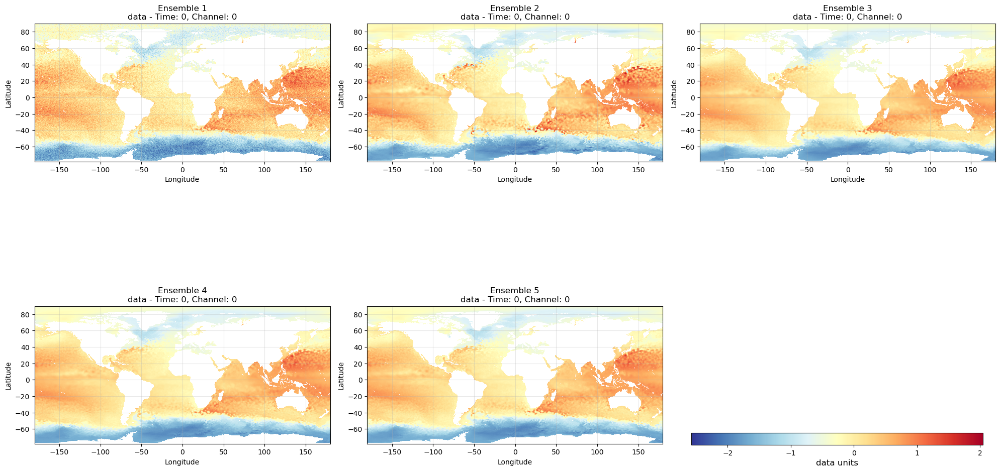

In [45]:
# 1. Global comparison of all ensembles
print("Creating global comparison plot...")
plot1 = plot_global_comparison(ensembles, ensemble_names, 
                      variable=variable_to_plot, 
                      time_idx=time_index, 
                      channel_idx=channel_index)

Creating regional comparison plots...


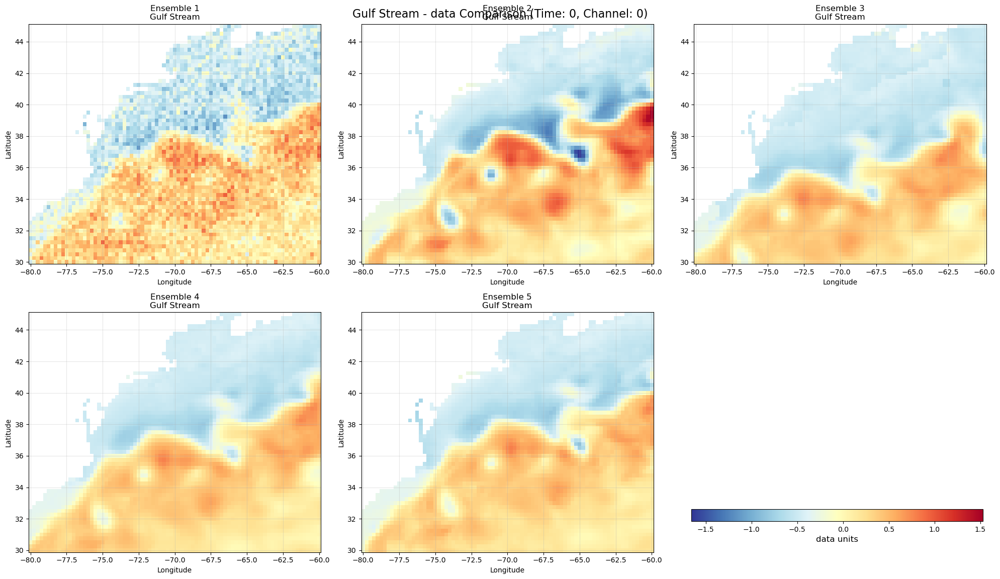

In [51]:
# 2. Regional comparisons for key dynamical zones
print("Creating regional comparison plots...")

# Gulf Stream region
plot2 = plot_regional_comparison(ensembles, ensemble_names, 'Gulf Stream', regions,
                        variable=variable_to_plot, 
                        time_idx=time_index, 
                        channel_idx=channel_index)

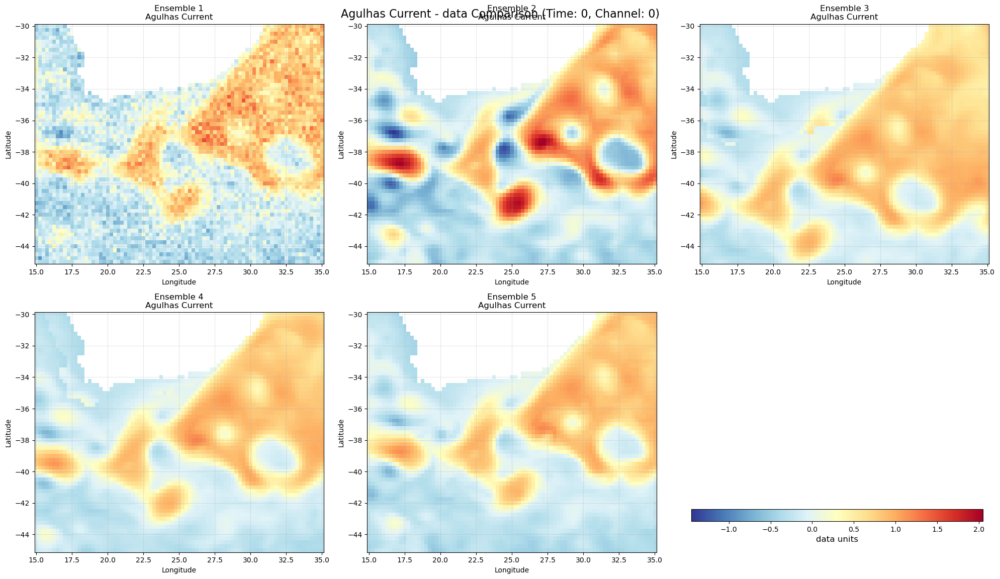

In [52]:
# Agulhas Current region
plot3 = plot_regional_comparison(ensembles, ensemble_names, 'Agulhas Current', regions,
                        variable=variable_to_plot, 
                        time_idx=time_index, 
                        channel_idx=channel_index)

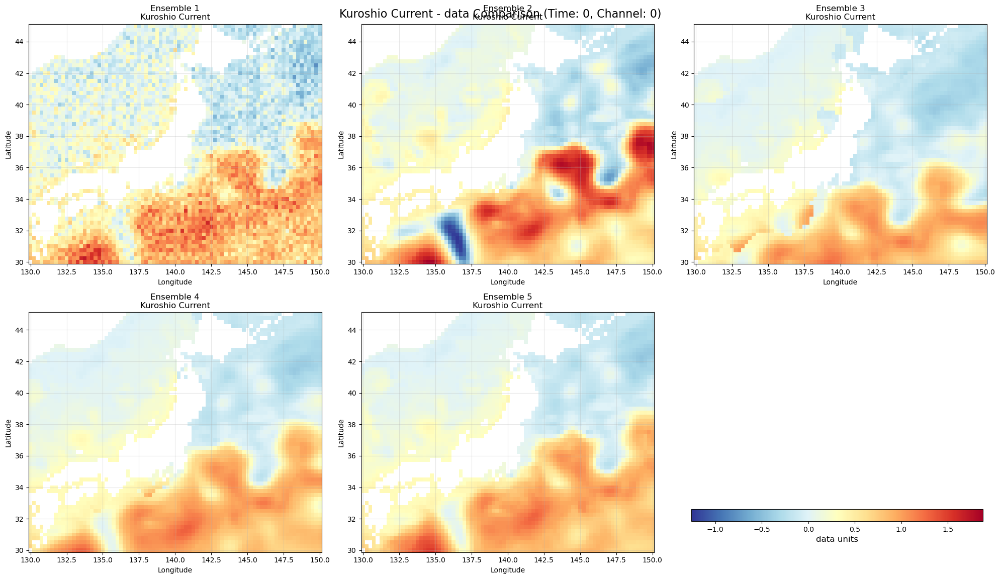

In [53]:
# Kuroshio Current region
plot4 = plot_regional_comparison(ensembles, ensemble_names, 'Kuroshio Current', regions,
                        variable=variable_to_plot, 
                        time_idx=time_index, 
                        channel_idx=channel_index)

Calculating ensemble statistics...
Calculating ensemble statistics for data...
Ensemble 1: Shape (672, 1440)
Ensemble 2: Shape (672, 1440)
Ensemble 3: Shape (672, 1440)
Ensemble 4: Shape (672, 1440)
Ensemble 5: Shape (672, 1440)
Statistics calculated (lazy evaluation with dask)
Plotting ensemble statistics...


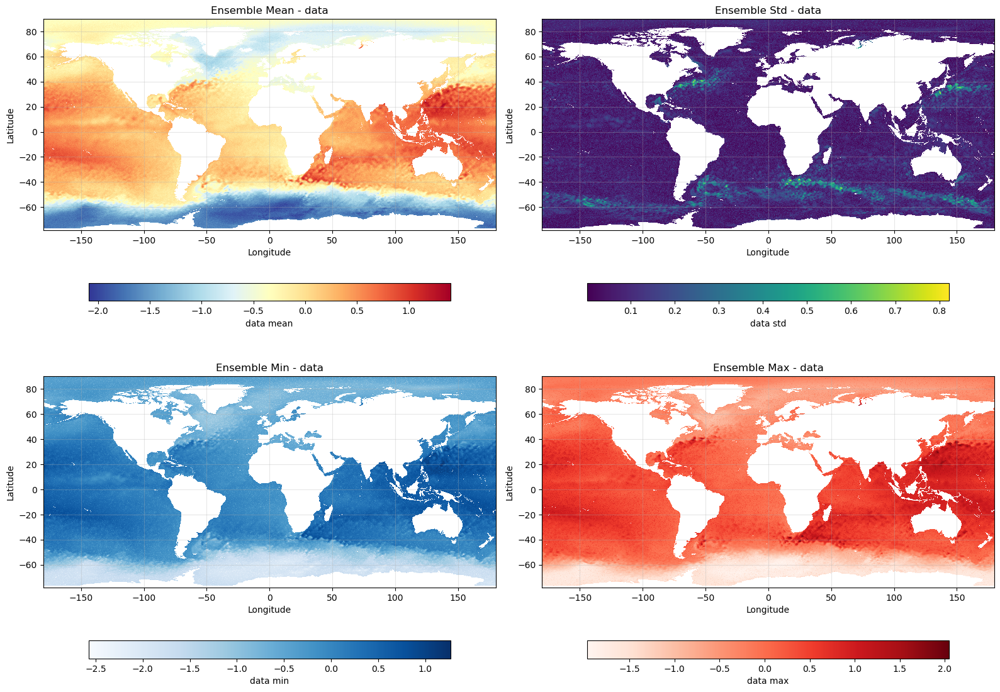

In [ ]:
# 3. Calculate and visualize ensemble statistics
print("Calculating ensemble statistics...")
stats = calculate_ensemble_statistics(ensembles, ensemble_names, 
                                     variable=variable_to_plot,
                                     time_idx=time_index, 
                                     channel_idx=channel_index)

if stats:
    print("Plotting ensemble statistics...")
    plot5 = plot_ensemble_statistics(stats, variable=variable_to_plot)

## Advanced Analysis: Ensemble Spread and Variability

Let's analyze the ensemble spread pysical consistency with variability.

> In regions where the reanalysis shows high spatial variability, the ensemble should show high spread


In [54]:
def compute_spatial_gradients(data_array, dx=None, dy=None):
    """
    Compute spatial gradient magnitude of a 2D field
    
    Parameters:
    -----------
    data_array : xarray.DataArray
        2D data field (lat, lon)
    dx, dy : float, optional
        Grid spacing in x and y directions (in degrees or meters)
        If None, will use coordinate differences
    
    Returns:
    --------
    gradient_magnitude : xarray.DataArray
        Magnitude of spatial gradient
    """
    # If no grid spacing provided, estimate from coordinates
    if dx is None:
        lon_diff = np.diff(data_array.lon.values)
        dx = np.mean(lon_diff) if len(lon_diff) > 0 else 1.0
    
    if dy is None:
        lat_diff = np.diff(data_array.lat.values)
        dy = np.mean(lat_diff) if len(lat_diff) > 0 else 1.0
    
    # Compute gradients using numpy gradient
    data_vals = data_array.values
    grad_y, grad_x = np.gradient(data_vals, dy, dx)
    
    # Compute gradient magnitude
    gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
    
    # Create new DataArray with same coordinates
    grad_da = xr.DataArray(
        gradient_magnitude,
        coords=data_array.coords,
        dims=data_array.dims,
        name=f'{data_array.name}_gradient_magnitude'
    )
    
    return grad_da

In [55]:
def compute_ensemble_spread(ensembles, variable='data', time_idx=0, channel_idx=0):
    """
    Compute ensemble spread (standard deviation) at each grid point
    
    Parameters:
    -----------
    ensembles : list of xarray.Dataset
        List of ensemble datasets
    variable : str
        Variable name to analyze
    time_idx : int
        Time index to analyze
    channel_idx : int
        Channel/depth index to analyze
    
    Returns:
    --------
    ensemble_spread : xarray.DataArray
        Standard deviation across ensemble members at each grid point
    ensemble_mean : xarray.DataArray
        Mean across ensemble members at each grid point
    """
    # Collect data slices from all ensembles
    data_slices = []
    
    for ens in ensembles:
        if variable in ens.data_vars:
            # Select time and channel slice
            if 'ch' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                data_slice = ens[variable].isel(time=time_idx)
            
            data_slices.append(data_slice)
    
    if not data_slices:
        raise ValueError(f"No valid data found for variable {variable}")
    
    # Stack ensembles along a new dimension
    ensemble_data = xr.concat(data_slices, dim='ensemble')
    
    # Compute ensemble statistics
    ensemble_mean = ensemble_data.mean(dim='ensemble')
    ensemble_spread = ensemble_data.std(dim='ensemble')
    
    return ensemble_spread, ensemble_mean

In [56]:
def create_ocean_mask(data_array, mask_type='ocean', gradient_threshold=None):
    """
    Create spatial masks for focused analysis
    
    Parameters:
    -----------
    data_array : xarray.DataArray
        2D data field to create mask from
    mask_type : str
        Type of mask: 'ocean', 'coastal', 'high_gradient'
    gradient_threshold : float, optional
        Threshold for high-gradient mask (percentile if < 1, absolute if >= 1)
    
    Returns:
    --------
    mask : xarray.DataArray
        Boolean mask (True where condition is met)
    """
    # Basic ocean mask (non-NaN values)
    ocean_mask = ~np.isnan(data_array.values)
    
    if mask_type == 'ocean':
        mask_values = ocean_mask
        
    elif mask_type == 'coastal':
        # Coastal areas: points near land-ocean boundaries
        from scipy import ndimage
        
        # Create a binary ocean mask
        binary_ocean = ocean_mask.astype(int)
        
        # Find edges using gradient
        edges = ndimage.sobel(binary_ocean)
        coastal_mask = (edges != 0) & ocean_mask
        mask_values = coastal_mask
        
    elif mask_type == 'high_gradient':
        # High gradient areas
        if gradient_threshold is None:
            gradient_threshold = 0.9  # 90th percentile
            
        gradients = compute_spatial_gradients(data_array)
        grad_values = gradients.values[ocean_mask]
        
        if gradient_threshold < 1:
            # Interpret as percentile
            threshold_val = np.nanpercentile(grad_values, gradient_threshold * 100)
        else:
            # Interpret as absolute threshold
            threshold_val = gradient_threshold
            
        high_grad_mask = (gradients.values >= threshold_val) & ocean_mask
        mask_values = high_grad_mask
        
    else:
        raise ValueError(f"Unknown mask_type: {mask_type}")
    
    # Create DataArray with same coordinates
    mask_da = xr.DataArray(
        mask_values,
        coords=data_array.coords,
        dims=data_array.dims,
        name=f'{mask_type}_mask'
    )
    
    return mask_da

In [57]:
def compute_gradient_spread_correlation(ensembles, variable='data', time_idx=0, channel_idx=0, 
                                      mask_type='ocean', gradient_threshold=None):
    """
    Compute Local Gradient-Spread Correlation analysis
    
    This function:
    1. Computes spatial gradient magnitude of the ensemble mean (proxy for reanalysis)
    2. Computes ensemble spread at each grid point
    3. Computes correlation between gradient and spread across the domain
    
    Parameters:
    -----------
    ensembles : list of xarray.Dataset
        List of ensemble datasets
    variable : str
        Variable name to analyze
    time_idx : int
        Time index to analyze
    channel_idx : int
        Channel/depth index to analyze
    mask_type : str
        Type of spatial mask: 'ocean', 'coastal', 'high_gradient'
    gradient_threshold : float, optional
        Threshold for high-gradient mask
    
    Returns:
    --------
    results : dict
        Dictionary containing:
        - 'gradient_magnitude': Spatial gradient magnitude
        - 'ensemble_spread': Ensemble spread
        - 'ensemble_mean': Ensemble mean
        - 'mask': Spatial mask used
        - 'correlation': Correlation coefficient
        - 'correlation_pvalue': P-value of correlation
        - 'masked_correlation': Correlation using only masked points
    """
    from scipy.stats import pearsonr
    
    # Step 1: Compute ensemble spread and mean
    print("Computing ensemble spread and mean...")
    ensemble_spread, ensemble_mean = compute_ensemble_spread(
        ensembles, variable, time_idx, channel_idx
    )
    
    # Compute ensemble mean (compute dask arrays)
    ensemble_mean_computed = ensemble_mean.compute()
    ensemble_spread_computed = ensemble_spread.compute()
    
    # Step 2: Compute spatial gradient magnitude of ensemble mean
    print("Computing spatial gradients...")
    gradient_magnitude = compute_spatial_gradients(ensemble_mean_computed)
    
    # Step 3: Create spatial mask
    print(f"Creating {mask_type} mask...")
    mask = create_ocean_mask(ensemble_mean_computed, mask_type, gradient_threshold)
    
    # Step 4: Compute correlations
    print("Computing correlations...")
    
    # Flatten arrays for correlation computation
    grad_flat = gradient_magnitude.values.flatten()
    spread_flat = ensemble_spread_computed.values.flatten()
    mask_flat = mask.values.flatten()
    
    # Remove NaN values
    valid_indices = ~(np.isnan(grad_flat) | np.isnan(spread_flat))
    grad_valid = grad_flat[valid_indices]
    spread_valid = spread_flat[valid_indices]
    mask_valid = mask_flat[valid_indices]
    
    # Overall correlation
    if len(grad_valid) > 1:
        correlation, p_value = pearsonr(grad_valid, spread_valid)
    else:
        correlation, p_value = np.nan, np.nan
    
    # Masked correlation (only where mask is True)
    masked_indices = mask_valid & valid_indices[valid_indices]
    if np.sum(masked_indices) > 1:
        grad_masked = grad_valid[masked_indices]
        spread_masked = spread_valid[masked_indices]
        masked_correlation, masked_p_value = pearsonr(grad_masked, spread_masked)
    else:
        masked_correlation, masked_p_value = np.nan, np.nan
    
    # Prepare results
    results = {
        'gradient_magnitude': gradient_magnitude,
        'ensemble_spread': ensemble_spread_computed,
        'ensemble_mean': ensemble_mean_computed,
        'mask': mask,
        'correlation': correlation,
        'correlation_pvalue': p_value,
        'masked_correlation': masked_correlation,
        'masked_correlation_pvalue': masked_p_value,
        'n_points_total': len(grad_valid),
        'n_points_masked': np.sum(masked_indices) if 'masked_indices' in locals() else 0
    }
    
    # Print summary
    print(f"\nGradient-Spread Correlation Results:")
    print(f"Overall correlation (r): {correlation:.4f} (p={p_value:.4f})")
    print(f"Masked correlation (r): {masked_correlation:.4f} (p={masked_p_value:.4f})")
    print(f"Total valid points: {results['n_points_total']}")
    print(f"Masked points used: {results['n_points_masked']}")
    
    return results

In [58]:
def plot_gradient_spread_analysis(results, variable='data', region_name=None):
    """
    Plot the gradient-spread correlation analysis results
    
    Parameters:
    -----------
    results : dict
        Results from compute_gradient_spread_correlation
    variable : str
        Variable name for labeling
    region_name : str, optional
        Region name for title
    """
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    
    gradient_mag = results['gradient_magnitude']
    ensemble_spread = results['ensemble_spread']
    ensemble_mean = results['ensemble_mean']
    mask = results['mask']
    
    # Plot 1: Ensemble Mean
    im1 = axes[0, 0].pcolormesh(ensemble_mean.lon, ensemble_mean.lat, ensemble_mean.values,
                               cmap='RdYlBu_r', shading='auto')
    axes[0, 0].set_title(f'Ensemble Mean\n{variable}')
    axes[0, 0].set_xlabel('Longitude')
    axes[0, 0].set_ylabel('Latitude')
    axes[0, 0].grid(True, alpha=0.3)
    plt.colorbar(im1, ax=axes[0, 0], orientation='horizontal', fraction=0.08, pad=0.15)
    
    # Plot 2: Gradient Magnitude
    im2 = axes[0, 1].pcolormesh(gradient_mag.lon, gradient_mag.lat, gradient_mag.values,
                               cmap='plasma', shading='auto')
    axes[0, 1].set_title(f'Spatial Gradient Magnitude\n{variable}')
    axes[0, 1].set_xlabel('Longitude')
    axes[0, 1].set_ylabel('Latitude')
    axes[0, 1].grid(True, alpha=0.3)
    plt.colorbar(im2, ax=axes[0, 1], orientation='horizontal', fraction=0.08, pad=0.15)
    
    # Plot 3: Ensemble Spread
    im3 = axes[0, 2].pcolormesh(ensemble_spread.lon, ensemble_spread.lat, ensemble_spread.values,
                               cmap='viridis', shading='auto')
    axes[0, 2].set_title(f'Ensemble Spread (Std Dev)\n{variable}')
    axes[0, 2].set_xlabel('Longitude')
    axes[0, 2].set_ylabel('Latitude')
    axes[0, 2].grid(True, alpha=0.3)
    plt.colorbar(im3, ax=axes[0, 2], orientation='horizontal', fraction=0.08, pad=0.15)
    
    # Plot 4: Spatial Mask
    im4 = axes[1, 0].pcolormesh(mask.lon, mask.lat, mask.values.astype(float),
                               cmap='RdGy', shading='auto', vmin=0, vmax=1)
    axes[1, 0].set_title(f'Spatial Mask\n({mask.name})')
    axes[1, 0].set_xlabel('Longitude')
    axes[1, 0].set_ylabel('Latitude')
    axes[1, 0].grid(True, alpha=0.3)
    plt.colorbar(im4, ax=axes[1, 0], orientation='horizontal', fraction=0.08, pad=0.15)
    
    # Plot 5: Scatter plot - Gradient vs Spread
    grad_flat = gradient_mag.values.flatten()
    spread_flat = ensemble_spread.values.flatten()
    mask_flat = mask.values.flatten()
    
    # Remove NaN values
    valid = ~(np.isnan(grad_flat) | np.isnan(spread_flat))
    grad_valid = grad_flat[valid]
    spread_valid = spread_flat[valid]
    mask_valid = mask_flat[valid]
    
    # Plot all points in light gray
    axes[1, 1].scatter(grad_valid, spread_valid, alpha=0.3, s=1, c='lightgray', label='All ocean')
    
    # Highlight masked points
    if np.sum(mask_valid) > 0:
        axes[1, 1].scatter(grad_valid[mask_valid], spread_valid[mask_valid], 
                          alpha=0.6, s=2, c='red', label=f'Masked region')
    
    axes[1, 1].set_xlabel('Gradient Magnitude')
    axes[1, 1].set_ylabel('Ensemble Spread')
    axes[1, 1].set_title(f'Gradient vs Spread\nr = {results["correlation"]:.3f}' + 
                        f' (masked: r = {results["masked_correlation"]:.3f})')
    axes[1, 1].grid(True, alpha=0.3)
    axes[1, 1].legend()
    
    # Plot 6: Regional statistics
    axes[1, 2].bar(['Overall\nCorrelation', 'Masked\nCorrelation'], 
                  [results['correlation'], results['masked_correlation']],
                  color=['skyblue', 'salmon'])
    axes[1, 2].set_ylabel('Correlation Coefficient')
    axes[1, 2].set_title('Gradient-Spread Correlations')
    axes[1, 2].grid(True, alpha=0.3)
    axes[1, 2].set_ylim(-1, 1)
    
    # Add correlation values as text
    axes[1, 2].text(0, results['correlation'] + 0.05, f'{results["correlation"]:.3f}', 
                   ha='center', va='bottom')
    axes[1, 2].text(1, results['masked_correlation'] + 0.05, f'{results["masked_correlation"]:.3f}', 
                   ha='center', va='bottom')
    
    # Overall title
    title = f'Local Gradient-Spread Correlation Analysis - {variable}'
    if region_name:
        title += f' ({region_name})'
    fig.suptitle(title, fontsize=16, y=0.98)
    
    plt.tight_layout()
    plt.show()
    
    return fig

## Local Gradient-Spread Correlation Analysis

Now let's perform the gradient-spread correlation analysis to examine whether ensemble spread is higher in regions with larger spatial gradients (which would indicate physical consistency).

**Theory**: In dynamically active regions with sharp gradients (e.g., fronts, eddies), we expect:
- Higher spatial gradients in the reanalysis field
- Higher ensemble spread due to increased uncertainty
- Positive correlation between gradient magnitude and ensemble spread

OCEAN-WIDE GRADIENT-SPREAD CORRELATION ANALYSIS
Computing ensemble spread and mean...
Computing spatial gradients...
Creating ocean mask...
Computing correlations...

Gradient-Spread Correlation Results:
Overall correlation (r): 0.3237 (p=0.0000)
Masked correlation (r): 0.3237 (p=0.0000)
Total valid points: 654839
Masked points used: 654839
Computing spatial gradients...
Creating ocean mask...
Computing correlations...

Gradient-Spread Correlation Results:
Overall correlation (r): 0.3237 (p=0.0000)
Masked correlation (r): 0.3237 (p=0.0000)
Total valid points: 654839
Masked points used: 654839


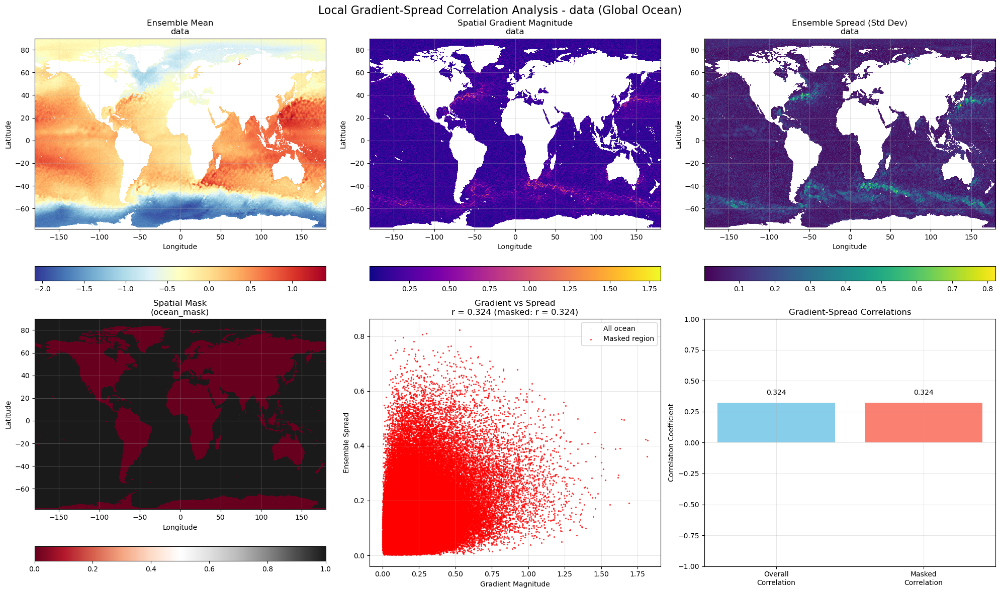

In [ ]:
# Perform gradient-spread correlation analysis with different masks

# 1. Ocean-wide analysis
print("=" * 60)
print("OCEAN-WIDE GRADIENT-SPREAD CORRELATION ANALYSIS")
print("=" * 60)

results_ocean = compute_gradient_spread_correlation(
    ensembles, 
    variable=variable_to_plot, 
    time_idx=time_index, 
    channel_idx=channel_index,
    mask_type='ocean'
)

# Plot results
plot6 = plot_gradient_spread_analysis(results_ocean, variable=variable_to_plot, region_name='Global Ocean')


HIGH-GRADIENT REGION ANALYSIS
Computing ensemble spread and mean...
Computing spatial gradients...
Creating high_gradient mask...
Computing correlations...

Gradient-Spread Correlation Results:
Overall correlation (r): 0.3237 (p=0.0000)
Masked correlation (r): 0.3824 (p=0.0000)
Total valid points: 654839
Masked points used: 130968
Computing spatial gradients...
Creating high_gradient mask...
Computing correlations...

Gradient-Spread Correlation Results:
Overall correlation (r): 0.3237 (p=0.0000)
Masked correlation (r): 0.3824 (p=0.0000)
Total valid points: 654839
Masked points used: 130968


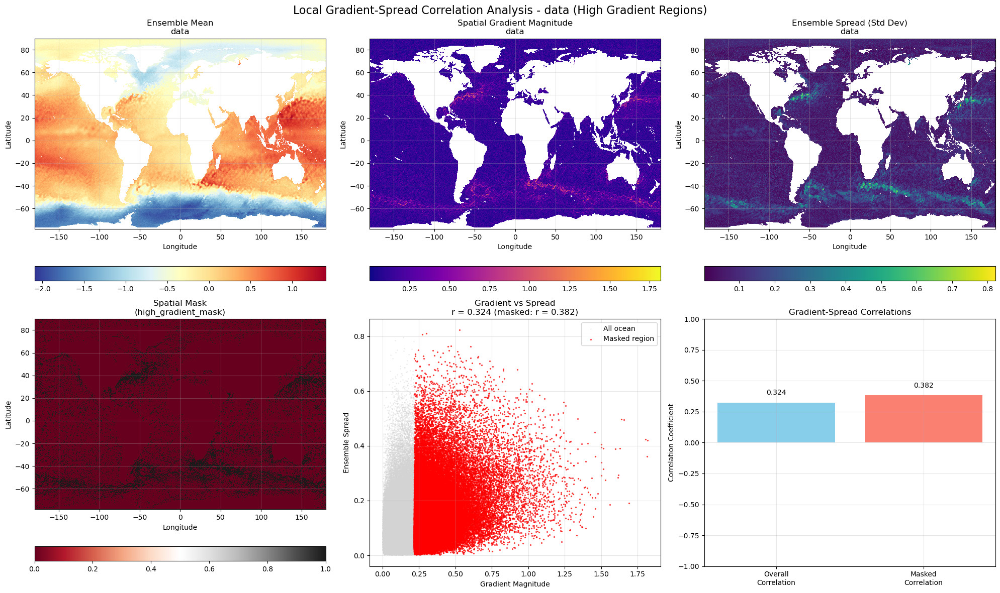

In [ ]:
# 2. High-gradient region analysis
print("\n" + "=" * 60)
print("HIGH-GRADIENT REGION ANALYSIS")
print("=" * 60)

results_high_grad = compute_gradient_spread_correlation(
    ensembles, 
    variable=variable_to_plot, 
    time_idx=time_index, 
    channel_idx=channel_index,
    mask_type='high_gradient',
    gradient_threshold=0.8  # Top 20% of gradient values
)

# Plot results
plot7 = plot_gradient_spread_analysis(results_high_grad, variable=variable_to_plot, region_name='High Gradient Regions')


COASTAL ZONE ANALYSIS
Computing ensemble spread and mean...
Computing spatial gradients...
Creating coastal mask...
Computing correlations...

Gradient-Spread Correlation Results:
Overall correlation (r): 0.3237 (p=0.0000)
Masked correlation (r): 0.0988 (p=0.0000)
Total valid points: 654839
Masked points used: 6832
Computing spatial gradients...
Creating coastal mask...
Computing correlations...

Gradient-Spread Correlation Results:
Overall correlation (r): 0.3237 (p=0.0000)
Masked correlation (r): 0.0988 (p=0.0000)
Total valid points: 654839
Masked points used: 6832


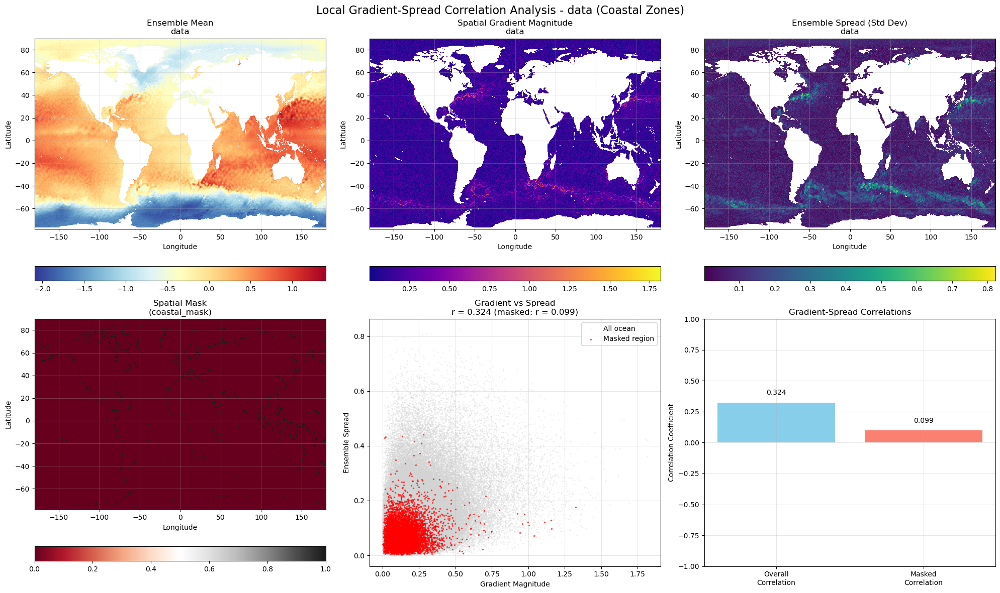

In [ ]:
# 3. Coastal zone analysis
print("\n" + "=" * 60)
print("COASTAL ZONE ANALYSIS")
print("=" * 60)

try:
    results_coastal = compute_gradient_spread_correlation(
        ensembles, 
        variable=variable_to_plot, 
        time_idx=time_index, 
        channel_idx=channel_index,
        mask_type='coastal'
    )
    
    # Plot results
    plot8 = plot_gradient_spread_analysis(results_coastal, variable=variable_to_plot, region_name='Coastal Zones')
    
except Exception as e:
    print(f"Coastal analysis failed: {e}")
    print("This might be due to the data structure - skipping coastal analysis")


REGIONAL DYNAMICAL ZONE ANALYSIS

Analyzing Gulf Stream region...
Computing regional ensemble spread and mean...
Computing regional spatial gradients...
Creating regional ocean mask...
Computing regional correlations...

Regional Gradient-Spread Correlation Results for Gulf Stream:
Overall correlation (r): 0.3740 (p=0.0000)
Masked correlation (r): 0.3740 (p=0.0000)
Total valid points: 3542
Masked points used: 3542


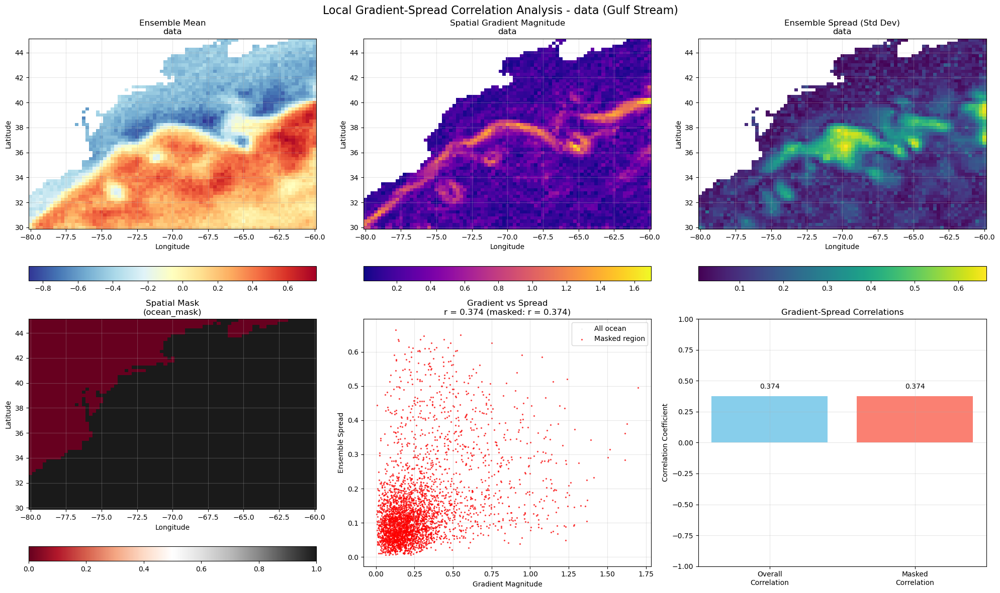


Analyzing Agulhas Current region...
Computing regional ensemble spread and mean...
Computing regional spatial gradients...
Creating regional ocean mask...
Computing regional correlations...

Regional Gradient-Spread Correlation Results for Agulhas Current:
Overall correlation (r): 0.2105 (p=0.0000)
Masked correlation (r): 0.2105 (p=0.0000)
Total valid points: 4109
Masked points used: 4109


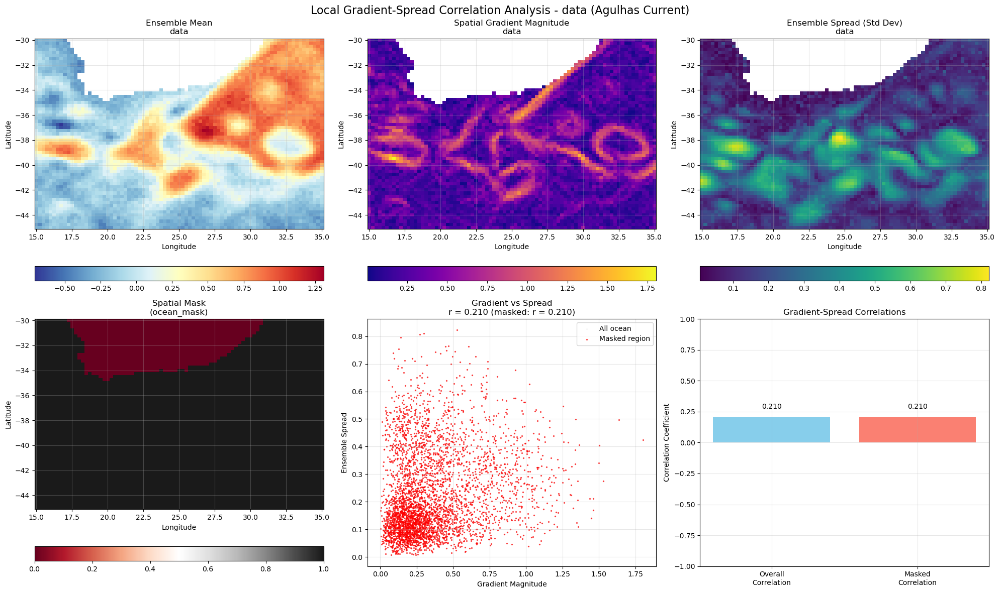


Analyzing Kuroshio Current region...
Computing regional ensemble spread and mean...
Computing regional spatial gradients...
Creating regional ocean mask...
Computing regional correlations...

Regional Gradient-Spread Correlation Results for Kuroshio Current:
Overall correlation (r): 0.3863 (p=0.0000)
Masked correlation (r): 0.3863 (p=0.0000)
Total valid points: 3723
Masked points used: 3723
Computing regional spatial gradients...
Creating regional ocean mask...
Computing regional correlations...

Regional Gradient-Spread Correlation Results for Kuroshio Current:
Overall correlation (r): 0.3863 (p=0.0000)
Masked correlation (r): 0.3863 (p=0.0000)
Total valid points: 3723
Masked points used: 3723


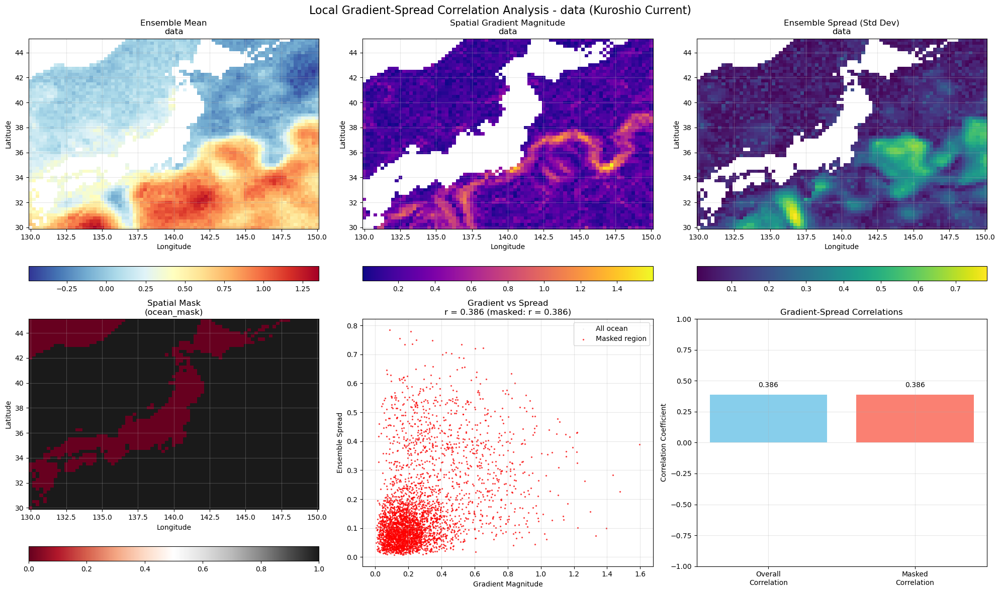


Analyzing Antarctic Circumpolar region...
Computing regional ensemble spread and mean...
Computing regional spatial gradients...
Creating regional ocean mask...
Computing regional correlations...

Regional Gradient-Spread Correlation Results for Antarctic Circumpolar:
Overall correlation (r): 0.3001 (p=0.0000)
Masked correlation (r): 0.3001 (p=0.0000)
Total valid points: 114588
Masked points used: 114588
Computing regional spatial gradients...
Creating regional ocean mask...
Computing regional correlations...

Regional Gradient-Spread Correlation Results for Antarctic Circumpolar:
Overall correlation (r): 0.3001 (p=0.0000)
Masked correlation (r): 0.3001 (p=0.0000)
Total valid points: 114588
Masked points used: 114588


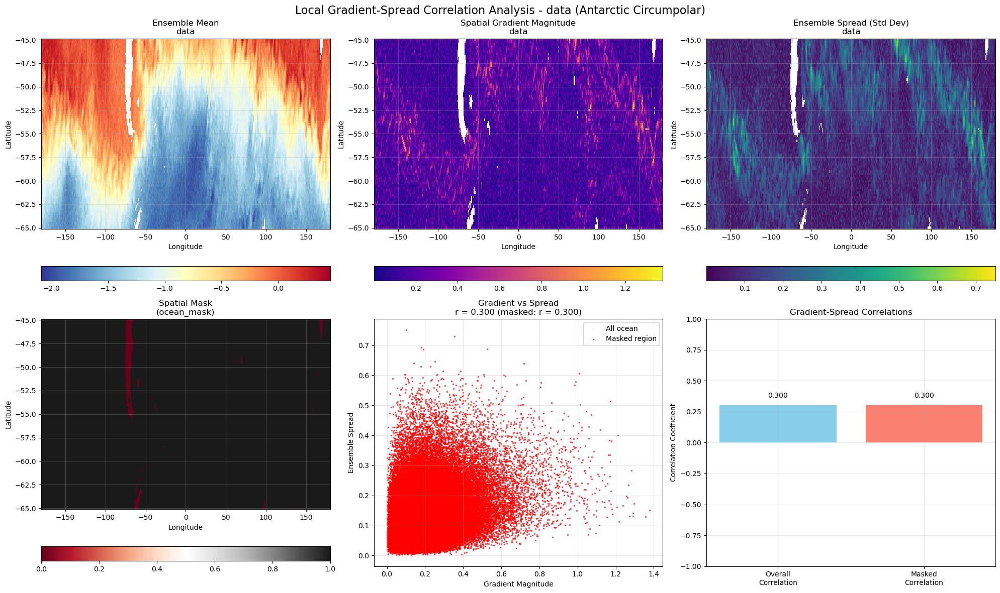

In [64]:
# 4. Regional analysis for specific dynamical zones
print("\n" + "=" * 60)
print("REGIONAL DYNAMICAL ZONE ANALYSIS")
print("=" * 60)

# Function to analyze specific geographical regions
def regional_gradient_spread_analysis(ensembles, region_name, region_bounds, 
                                    variable='data', time_idx=0, channel_idx=0):
    """
    Perform gradient-spread analysis for a specific geographical region
    """
    # First get data for the region
    regional_ensembles = []
    
    for ens in ensembles:
        if variable in ens.data_vars:
            # Select time and channel slice
            if 'ch' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                data_slice = ens[variable].isel(time=time_idx)
            
            # Select regional data
            regional_data = data_slice.sel(
                lat=slice(region_bounds['lat_min'], region_bounds['lat_max']),
                lon=slice(region_bounds['lon_min'], region_bounds['lon_max'])
            )
            
            # Create a temporary dataset for this region
            regional_ds = xr.Dataset({variable: regional_data})
            regional_ensembles.append(regional_ds)
    
    # For regional analysis, we need to use a modified function that doesn't 
    # try to select time/channel again since data is already sliced
    from scipy.stats import pearsonr
    
    # Step 1: Compute ensemble spread and mean for regional data
    print("Computing regional ensemble spread and mean...")
    data_slices = []
    
    for regional_ds in regional_ensembles:
        if variable in regional_ds.data_vars:
            data_slices.append(regional_ds[variable])
    
    if not data_slices:
        raise ValueError(f"No valid regional data found for variable {variable}")
    
    # Stack ensembles along a new dimension
    ensemble_data = xr.concat(data_slices, dim='ensemble')
    
    # Compute ensemble statistics
    ensemble_mean = ensemble_data.mean(dim='ensemble')
    ensemble_spread = ensemble_data.std(dim='ensemble')
    
    # Compute ensemble mean (compute dask arrays)
    ensemble_mean_computed = ensemble_mean.compute()
    ensemble_spread_computed = ensemble_spread.compute()
    
    # Step 2: Compute spatial gradient magnitude of ensemble mean
    print("Computing regional spatial gradients...")
    gradient_magnitude = compute_spatial_gradients(ensemble_mean_computed)
    
    # Step 3: Create spatial mask (ocean mask for regional data)
    print("Creating regional ocean mask...")
    mask = create_ocean_mask(ensemble_mean_computed, 'ocean', None)
    
    # Step 4: Compute correlations
    print("Computing regional correlations...")
    
    # Flatten arrays for correlation computation
    grad_flat = gradient_magnitude.values.flatten()
    spread_flat = ensemble_spread_computed.values.flatten()
    mask_flat = mask.values.flatten()
    
    # Remove NaN values
    valid_indices = ~(np.isnan(grad_flat) | np.isnan(spread_flat))
    grad_valid = grad_flat[valid_indices]
    spread_valid = spread_flat[valid_indices]
    mask_valid = mask_flat[valid_indices]
    
    # Overall correlation
    if len(grad_valid) > 1:
        correlation, p_value = pearsonr(grad_valid, spread_valid)
    else:
        correlation, p_value = np.nan, np.nan
    
    # Masked correlation (only where mask is True)
    masked_indices = mask_valid & valid_indices[valid_indices]
    if np.sum(masked_indices) > 1:
        grad_masked = grad_valid[masked_indices]
        spread_masked = spread_valid[masked_indices]
        masked_correlation, masked_p_value = pearsonr(grad_masked, spread_masked)
    else:
        masked_correlation, masked_p_value = np.nan, np.nan
    
    # Prepare results
    results = {
        'gradient_magnitude': gradient_magnitude,
        'ensemble_spread': ensemble_spread_computed,
        'ensemble_mean': ensemble_mean_computed,
        'mask': mask,
        'correlation': correlation,
        'correlation_pvalue': p_value,
        'masked_correlation': masked_correlation,
        'masked_correlation_pvalue': masked_p_value,
        'n_points_total': len(grad_valid),
        'n_points_masked': np.sum(masked_indices) if 'masked_indices' in locals() else 0
    }
    
    # Print summary
    print(f"\nRegional Gradient-Spread Correlation Results for {region_name}:")
    print(f"Overall correlation (r): {correlation:.4f} (p={p_value:.4f})")
    print(f"Masked correlation (r): {masked_correlation:.4f} (p={masked_p_value:.4f})")
    print(f"Total valid points: {results['n_points_total']}")
    print(f"Masked points used: {results['n_points_masked']}")
    
    return results

# Analyze all defined regions
regional_results = {}

for region_name, region_bounds in regions.items():
    print(f"\nAnalyzing {region_name} region...")
    try:
        results = regional_gradient_spread_analysis(
            ensembles, region_name, region_bounds,
            variable_to_plot, time_index, channel_index
        )
        regional_results[region_name] = results
        
        # Plot results for this region
        plot_gradient_spread_analysis(results, variable=variable_to_plot, 
                                    region_name=region_name)
        
    except Exception as e:
        print(f"{region_name} analysis failed: {e}")
        # Continue with next region


SUMMARY OF GRADIENT-SPREAD CORRELATIONS
Gradient-Spread Correlation Summary:
               Region  Overall_Correlation  Overall_P_Value  Masked_Correlation  Masked_P_Value  N_Points  N_Masked
         Global Ocean               0.3237              0.0              0.3237             0.0    654839    654839
 High Gradient (>80%)               0.3237              0.0              0.3824             0.0    654839    130968
        Coastal Zones               0.3237              0.0              0.0988             0.0    654839      6832
          Gulf Stream               0.3740              0.0              0.3740             0.0      3542      3542
      Agulhas Current               0.2105              0.0              0.2105             0.0      4109      4109
     Kuroshio Current               0.3863              0.0              0.3863             0.0      3723      3723
Antarctic Circumpolar               0.3001              0.0              0.3001             0.0    114588    1

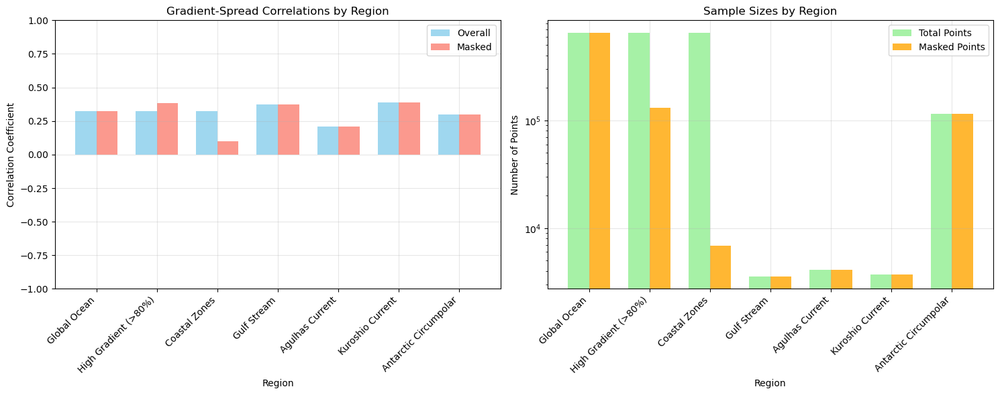


INTERPRETATION GUIDE
Positive correlation (r > 0): Higher gradients → Higher ensemble spread
  → Good! Indicates ensemble spread increases in dynamically active regions
Negative correlation (r < 0): Higher gradients → Lower ensemble spread
  → Concerning! May indicate ensemble is too conservative in active regions
Near-zero correlation (r ≈ 0): No clear relationship
  → May indicate ensemble spread not physically consistent with gradients

Statistical significance:
p < 0.05: Correlation is statistically significant
p ≥ 0.05: Correlation not statistically significant


In [65]:
# 5. Summary comparison of correlation results
print("\n" + "=" * 60)
print("SUMMARY OF GRADIENT-SPREAD CORRELATIONS")
print("=" * 60)

# Collect results for comparison
correlation_summary = []

# Add ocean-wide results
correlation_summary.append({
    'Region': 'Global Ocean',
    'Overall_Correlation': results_ocean['correlation'],
    'Overall_P_Value': results_ocean['correlation_pvalue'],
    'Masked_Correlation': results_ocean['masked_correlation'],
    'Masked_P_Value': results_ocean['masked_correlation_pvalue'],
    'N_Points': results_ocean['n_points_total'],
    'N_Masked': results_ocean['n_points_masked']
})

# Add high-gradient results
correlation_summary.append({
    'Region': 'High Gradient (>80%)',
    'Overall_Correlation': results_high_grad['correlation'],
    'Overall_P_Value': results_high_grad['correlation_pvalue'],
    'Masked_Correlation': results_high_grad['masked_correlation'],
    'Masked_P_Value': results_high_grad['masked_correlation_pvalue'],
    'N_Points': results_high_grad['n_points_total'],
    'N_Masked': results_high_grad['n_points_masked']
})

# Add coastal results if available
if 'results_coastal' in locals():
    correlation_summary.append({
        'Region': 'Coastal Zones',
        'Overall_Correlation': results_coastal['correlation'],
        'Overall_P_Value': results_coastal['correlation_pvalue'],
        'Masked_Correlation': results_coastal['masked_correlation'],
        'Masked_P_Value': results_coastal['masked_correlation_pvalue'],
        'N_Points': results_coastal['n_points_total'],
        'N_Masked': results_coastal['n_points_masked']
    })

# Add regional results if available
if 'regional_results' in locals():
    for region_name, regional_result in regional_results.items():
        correlation_summary.append({
            'Region': region_name,
            'Overall_Correlation': regional_result['correlation'],
            'Overall_P_Value': regional_result['correlation_pvalue'],
            'Masked_Correlation': regional_result['masked_correlation'],
            'Masked_P_Value': regional_result['masked_correlation_pvalue'],
            'N_Points': regional_result['n_points_total'],
            'N_Masked': regional_result['n_points_masked']
        })

# Create summary DataFrame
import pandas as pd
summary_df = pd.DataFrame(correlation_summary)

print("Gradient-Spread Correlation Summary:")
print("=" * 100)
print(summary_df.round(4).to_string(index=False))

# Plot comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Plot overall correlations
regions_list = summary_df['Region'].tolist()
overall_corrs = summary_df['Overall_Correlation'].tolist()
masked_corrs = summary_df['Masked_Correlation'].tolist()

x_pos = np.arange(len(regions_list))
width = 0.35

ax1.bar(x_pos - width/2, overall_corrs, width, label='Overall', alpha=0.8, color='skyblue')
ax1.bar(x_pos + width/2, masked_corrs, width, label='Masked', alpha=0.8, color='salmon')

ax1.set_xlabel('Region')
ax1.set_ylabel('Correlation Coefficient')
ax1.set_title('Gradient-Spread Correlations by Region')
ax1.set_xticks(x_pos)
ax1.set_xticklabels(regions_list, rotation=45, ha='right')
ax1.legend()
ax1.grid(True, alpha=0.3)
ax1.set_ylim(-1, 1)

# Plot number of points
n_points = summary_df['N_Points'].tolist()
n_masked = summary_df['N_Masked'].tolist()

ax2.bar(x_pos - width/2, n_points, width, label='Total Points', alpha=0.8, color='lightgreen')
ax2.bar(x_pos + width/2, n_masked, width, label='Masked Points', alpha=0.8, color='orange')

ax2.set_xlabel('Region')
ax2.set_ylabel('Number of Points')
ax2.set_title('Sample Sizes by Region')
ax2.set_xticks(x_pos)
ax2.set_xticklabels(regions_list, rotation=45, ha='right')
ax2.legend()
ax2.grid(True, alpha=0.3)
ax2.set_yscale('log')  # Log scale due to potentially large differences

plt.tight_layout()
plt.show()

print("\n" + "=" * 60)
print("INTERPRETATION GUIDE")
print("=" * 60)
print("Positive correlation (r > 0): Higher gradients → Higher ensemble spread")
print("  → Good! Indicates ensemble spread increases in dynamically active regions")
print("Negative correlation (r < 0): Higher gradients → Lower ensemble spread")  
print("  → Concerning! May indicate ensemble is too conservative in active regions")
print("Near-zero correlation (r ≈ 0): No clear relationship")
print("  → May indicate ensemble spread not physically consistent with gradients")
print("\nStatistical significance:")
print("p < 0.05: Correlation is statistically significant")
print("p ≥ 0.05: Correlation not statistically significant")
print("=" * 60)